<a href="https://colab.research.google.com/github/fahimshahariar1/dog-breed-identification/blob/main/Dog_breed_identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
 #!unzip "/content/drive/MyDrive/Dog Breed Identificattion/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Breed Identificattion/"

# Dog Breed Identfication
This notebook builds an end-to-end multi-class image classifier using TensorFlow and TensorFlow Hub.

## 1. Problem
> Identifying the breed of a dog given an image of a dog
## 2. Data
> As Data we are using Kaggle's Dog breed identification. You can find it here
https://www.kaggle.com/competitions/dog-breed-identification

## 3. Evaluation

>The evaluation is a file with prediction probabilities for each dog breed of each test image

## 4. Features
> Some information about the data:
* We are dealing with images (Unstructured Data) so it's probably best we use deep learning / transfer learning.
* There are 120 breeds of Dogs which means it has  120 different classes.
* There are around 10k+ test images and 10k+ train images

### Get our workspace ready




In [2]:
#import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print(tf.__version__)

#Check for GPU availability
print(tf.config.list_physical_devices("GPU"))

2.19.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


### Getting our data ready (Turning into tensors)
With all machine learning models our data has to be in numerical format,So that's what we will be doing first. Turning our images into tensors/numerical representations:

Let's start by accessing our data and checking out the labels

In [3]:
#checkout the labels of our data
import pandas as pd

labels_csv = pd.read_csv("/content/drive/MyDrive/Dog Breed Identificattion/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

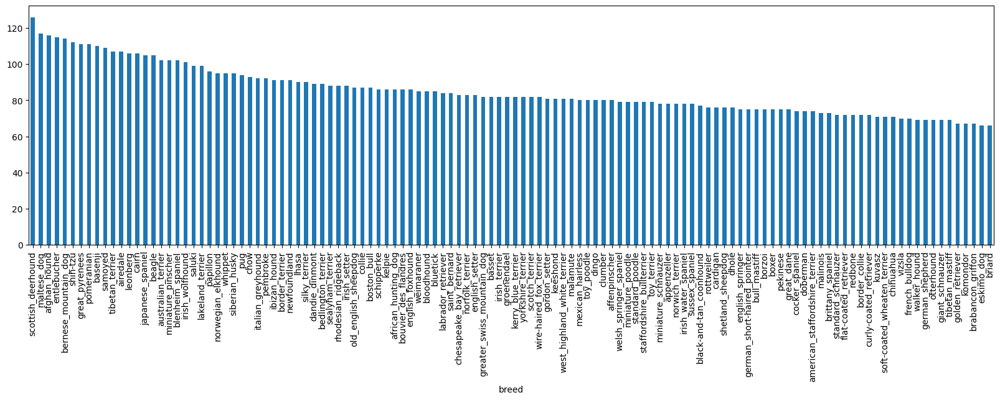

In [4]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,5))

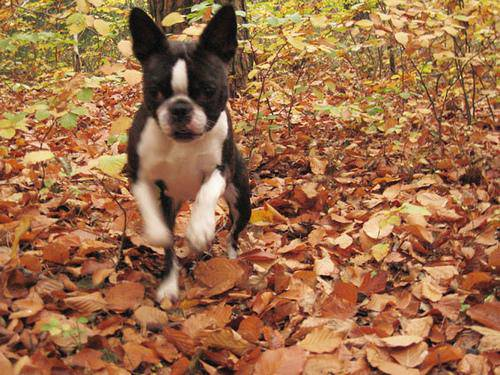

In [5]:
#Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog Breed Identificattion/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels
Let's get a list of all our imagen file pathnames

In [6]:
# Create pathnames from image Id
filename = ["/content/drive/MyDrive/Dog Breed Identificattion/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filename[:10]

['/content/drive/MyDrive/Dog Breed Identificattion/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [7]:
#Lets' check whether filenames matches actual amount of files
import os
if len(os.listdir("/content/drive/MyDrive/Dog Breed Identificattion/train/")) == len(filename):
  print("Success")
else:
  print("Check again")

Success


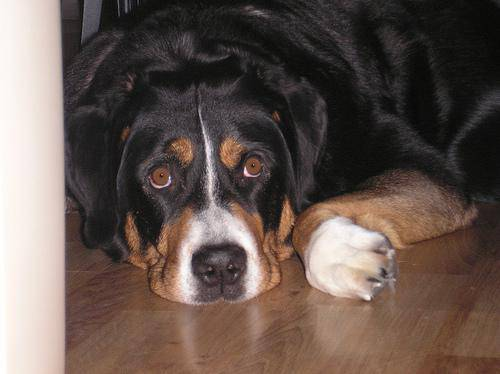

In [8]:
Image(filename[200])

Since we have now got our training image file paths in a list, let's prepare our labels

In [9]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
len(labels)

10222

In [10]:
# See if number of labels matches the number of filenames
if len(labels) == len(filename):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [11]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [12]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [13]:
# Turn every labels into a boolean array
boolean_labels = [labels == unique_breeds for labels in labels]
boolean_labels[2]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [14]:
len(labels)

10222

In [15]:
boolean_labels = [label == unique_breeds for label in labels]
print(boolean_labels[0].astype(int))

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [16]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [17]:
len(boolean_labels)

10222

In [18]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [19]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [20]:
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [21]:
filename[:10]

['/content/drive/MyDrive/Dog Breed Identificattion/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Setting our very own validation set
As kaggle dataset doesn't provide us with any validation set, we are going to create our own

---



In [22]:
#Setup X & y variables
X = filename
y = boolean_labels

In [23]:
len(filename)

10222

In [24]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000}

In [25]:
#Let's split the data into train and validation
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

In [26]:
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

## Preprocessing Images (Turning image sinto Tensors)

In [27]:
#Define Image size
IMG_SIZE = 224

#Creating a functon to preprocess the images
def process_image(image_path):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

In [28]:
#Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [29]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [30]:
#Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [31]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
Our data is now in batches, these can be hard to understand, So we will try to visualize them

In [32]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range (25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i]])
    plt.axis("off")


In [33]:
train_images, train_lables = next(train_data.as_numpy_iterator())
train_images, train_lables

(array([[[[2.53781527e-01, 8.12324956e-02, 4.59383801e-02],
          [3.31827730e-01, 1.53291315e-01, 1.16001405e-01],
          [3.40231091e-01, 1.55917376e-01, 1.16701685e-01],
          ...,
          [5.90371072e-01, 3.08018118e-01, 1.58998504e-01],
          [5.74614644e-01, 2.92261720e-01, 1.39390424e-01],
          [5.62114894e-01, 2.79761940e-01, 1.22899204e-01]],
 
         [[2.47175455e-01, 7.46264160e-02, 3.93323004e-02],
          [3.21936280e-01, 1.43399864e-01, 1.06109947e-01],
          [3.35373700e-01, 1.51059955e-01, 1.11844279e-01],
          ...,
          [5.59919596e-01, 2.77566642e-01, 1.28547013e-01],
          [5.54761231e-01, 2.72408277e-01, 1.19536996e-01],
          [5.49573958e-01, 2.67220974e-01, 1.10358231e-01]],
 
         [[2.40674108e-01, 6.81250691e-02, 3.28309461e-02],
          [3.07068616e-01, 1.29574642e-01, 9.19372439e-02],
          [3.26091081e-01, 1.43825650e-01, 1.03927203e-01],
          ...,
          [5.23014784e-01, 2.40661815e-01, 9.1642

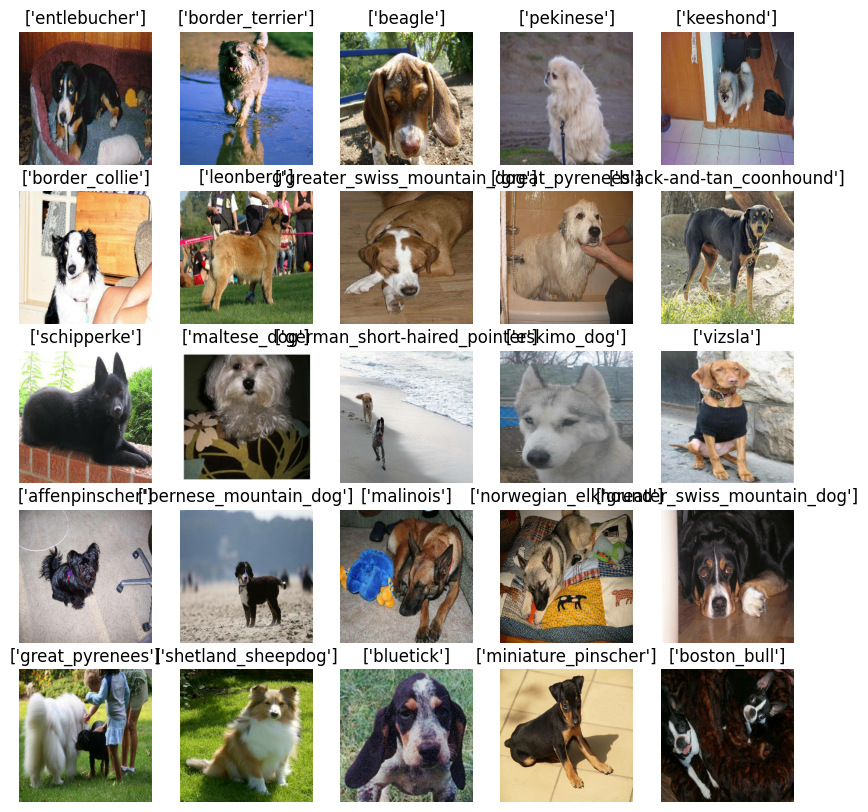

In [34]:
#Let's visualize the data
show_25_images(train_images, train_lables)

In [35]:
val_images, val_lables = next(val_data.as_numpy_iterator())
val_images, val_lables

(array([[[[0.29599646, 0.43284872, 0.3056691 ],
          [0.26635826, 0.32996926, 0.22846507],
          [0.31428418, 0.27701408, 0.22934894],
          ...,
          [0.77614343, 0.82320225, 0.8101595 ],
          [0.81291157, 0.8285351 , 0.8406944 ],
          [0.8209297 , 0.8263737 , 0.8423668 ]],
 
         [[0.2344871 , 0.31603682, 0.19543913],
          [0.3414841 , 0.36560842, 0.27241898],
          [0.45016077, 0.40117094, 0.33964607],
          ...,
          [0.7663987 , 0.8134138 , 0.81350833],
          [0.7304248 , 0.75012016, 0.76590735],
          [0.74518913, 0.76002574, 0.7830809 ]],
 
         [[0.30157745, 0.3082587 , 0.21018331],
          [0.2905954 , 0.27066195, 0.18401104],
          [0.4138316 , 0.36170745, 0.2964005 ],
          ...,
          [0.79871625, 0.8418535 , 0.8606443 ],
          [0.7957738 , 0.82859945, 0.8605655 ],
          [0.75181633, 0.77904975, 0.8155256 ]],
 
         ...,
 
         [[0.9746779 , 0.9878955 , 0.9342279 ],
          [0.99153

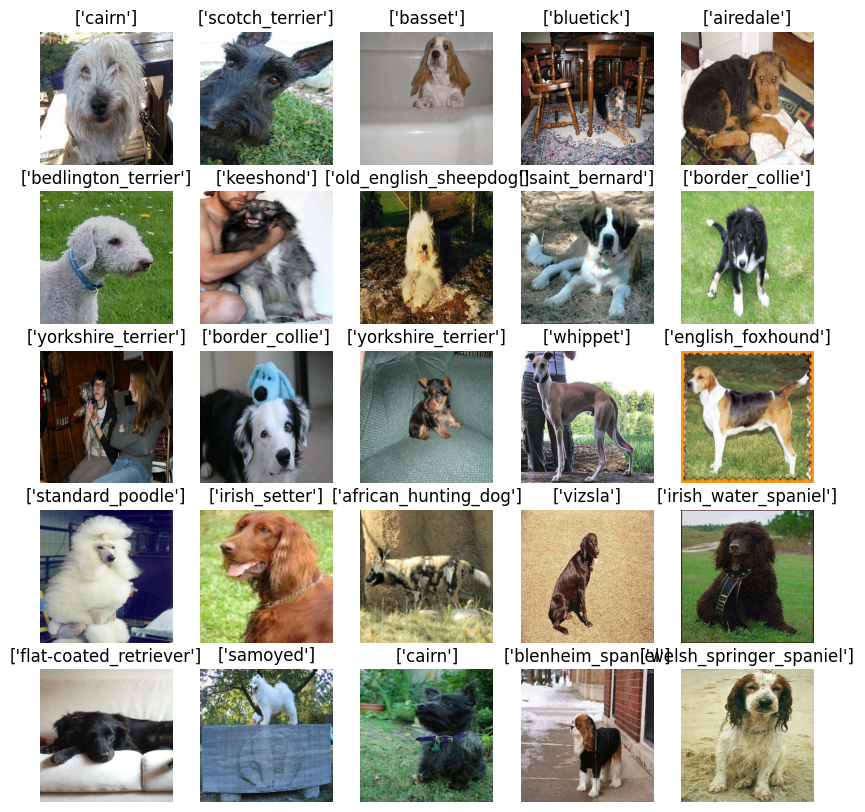

In [36]:
show_25_images(val_images, val_lables)

## Building a model

In [37]:
import tf_keras as keras                # <-- use tf-keras API
from tensorflow_hub import KerasLayer

INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5"  # use feature_vector model that accepts 224x224 input

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building with:", model_url)
    model = keras.Sequential([
        KerasLayer(model_url, input_shape=input_shape, trainable=False),  # freeze base
        keras.layers.Dense(output_shape, activation="softmax")
    ])
    model.compile(
        loss=keras.losses.CategoricalCrossentropy(),
        optimizer=keras.optimizers.Adam(),
        metrics=["accuracy"]
    )
    return model

model = create_model()
model.summary()

Building with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 120)               153720    
                                                                 
Total params: 2411704 (9.20 MB)
Trainable params: 153720 (600.47 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


## Creating Callbacks

Callbacks helps us as a function for our model that can be used during training for things such as save progress, check its progress

### Tensoboard Callback

In [38]:
import datetime
def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/Dog Breed Identificattion/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics stops improving

In [39]:
#creating early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy", patience=3)

## Training a model (On subset of data)

In [40]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [57]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  from tf_keras.callbacks import EarlyStopping, TensorBoard

# recreate BOTH callbacks from tf_keras
  early_stopping = EarlyStopping(monitor="val_accuracy", patience=3, restore_best_weights=True)
  tensorboard = TensorBoard(log_dir="/content/drive/MyDrive/Dog Breed Identificattion/logs/run") # Update log_dir

  model.fit(train_data, epochs=NUM_EPOCHS, validation_data=val_data,
          callbacks=[tensorboard, early_stopping])


  # Return the fitted model
  return model

In [58]:
#model = train_model()

### Checking tensorboard logs

In [59]:
%load_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/Dog Breed Identificattion/logs"

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1611), started 0:25:09 ago. (Use '!kill 1611' to kill it.)

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [60]:
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 141ms/step


array([[0.00515198, 0.00287898, 0.01928055, ..., 0.0017854 , 0.00167789,
        0.00322651],
       [0.00464277, 0.00263303, 0.01940773, ..., 0.00086237, 0.00350234,
        0.00567476],
       [0.00704108, 0.00606703, 0.02006925, ..., 0.00171291, 0.00112701,
        0.01598483],
       ...,
       [0.01073374, 0.00648096, 0.0166373 , ..., 0.00690069, 0.00298235,
        0.03447038],
       [0.0097758 , 0.00248361, 0.01754274, ..., 0.00139208, 0.00126107,
        0.00269803],
       [0.00719783, 0.00448721, 0.00279002, ..., 0.00171125, 0.00947917,
        0.00399301]], dtype=float32)

Let's create a function to turn this huge data into human readable data

In [61]:
# Turn prediction probabilities into label

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[81])
pred_label

'english_foxhound'

In [62]:
# Create a function to unbatch a dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels"""
  images = []
  labels = []
  for image, label in data.unbatch():
    images.append(image.numpy())
    labels.append(unique_breeds[label.numpy().argmax()])
  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [63]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction"""
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title(f"Prediction: {pred_label}, {np.max(pred_prob)*100:.1f}% | GT: {true_label}", color=color)
  plt.axis(False)

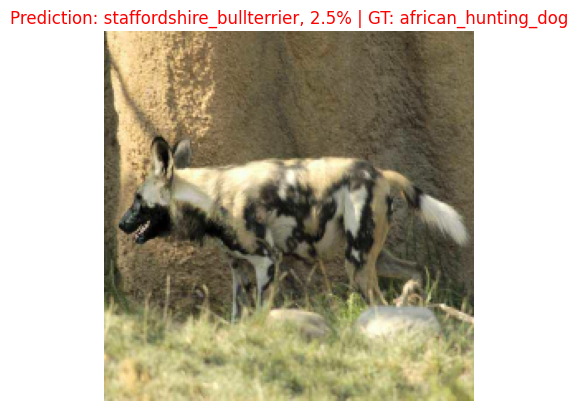

In [64]:
plot_pred(predictions, val_labels, val_images, n=17)

In [65]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Create a list of colors for the bars
  colors = ["blue"] * 10  # Start with all blue bars
  if true_label in top_10_pred_labels:
    # Find the index of the true label in the top 10 predictions
    true_label_index = np.where(top_10_pred_labels == true_label)[0][0]
    colors[true_label_index] = "green" # Set the color of the true label bar to green


  plt.bar(range(10), top_10_pred_values, tick_label=top_10_pred_labels, color=colors)
  plt.xticks(rotation="vertical")

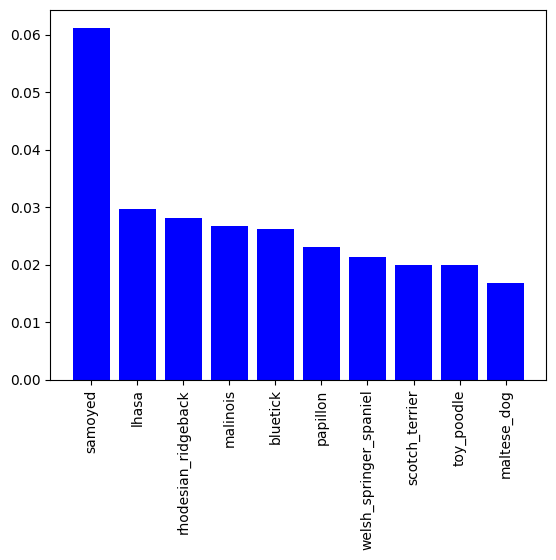

In [66]:
plot_pred_conf(predictions, val_labels, n=60)

## Training a dog model on full data

In [67]:
full_data = create_data_batches(X, y)
full_data

Creating training data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [68]:
full_model = create_model()

Building with: https://tfhub.dev/google/imagenet/mobilenet_v2_100_224/feature_vector/5


In [69]:
from tf_keras.callbacks import EarlyStopping, TensorBoard
full_model_tensorboard = TensorBoard(log_dir="/content/drive/MyDrive/Dog Breed Identificattion/logs/full_model_run")
full_model_early_stopping = EarlyStopping(monitor="val_accuracy", patience=3, restore_best_weights=True)

In [70]:
full_model.fit(full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard])

Epoch 1/100
320/320 [==============================] - ETA: 0s - loss: 1.3415 - accuracy: 0.6751

320/320 [==============================] - 45s 128ms/step - loss: 1.3415 - accuracy: 0.6751
Epoch 2/100
319/320 [============================>.] - ETA: 0s - loss: 0.4178 - accuracy: 0.8814

320/320 [==============================] - 37s 115ms/step - loss: 0.4180 - accuracy: 0.8813
Epoch 3/100
319/320 [============================>.] - ETA: 0s - loss: 0.2566 - accuracy: 0.9377

320/320 [==============================] - 39s 120ms/step - loss: 0.2564 - accuracy: 0.9377
Epoch 4/100
319/320 [============================>.] - ETA: 0s - loss: 0.1767 - accuracy: 0.9644

320/320 [==============================] - 39s 123ms/step - loss: 0.1766 - accuracy: 0.9645
Epoch 5/100
319/320 [============================>.] - ETA: 0s - loss: 0.1263 - accuracy: 0.9790

320/320 [==============================] - 38s 120ms/step - loss: 0.1264 - accuracy: 0.9790
Epoch 6/100
319/320 [============================>.] - ETA: 0s - loss: 0.0924 - accuracy: 0.9869

320/320 [==============================] - 41s 129ms/step - loss: 0.0923 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - ETA: 0s - loss: 0.0696 - accuracy: 0.9931

320/320 [==============================] - 43s 133ms/step - loss: 0.0696 - accuracy: 0.9931
Epoch 8/100
319/320 [============================>.] - ETA: 0s - loss: 0.0550 - accuracy: 0.9956

320/320 [==============================] - 41s 129ms/step - loss: 0.0550 - accuracy: 0.9956
Epoch 9/100
319/320 [============================>.] - ETA: 0s - loss: 0.0438 - accuracy: 0.9970

320/320 [==============================] - 39s 123ms/step - loss: 0.0437 - accuracy: 0.9970
Epoch 10/100
319/320 [============================>.] - ETA: 0s - loss: 0.0357 - accuracy: 0.9983

320/320 [==============================] - 40s 125ms/step - loss: 0.0357 - accuracy: 0.9983
Epoch 11/100
319/320 [============================>.] - ETA: 0s - loss: 0.0302 - accuracy: 0.9985

320/320 [==============================] - 39s 121ms/step - loss: 0.0302 - accuracy: 0.9985
Epoch 12/100
319/320 [============================>.] - ETA: 0s - loss: 0.0255 - accuracy: 0.9986

320/320 [==============================] - 40s 124ms/step - loss: 0.0255 - accuracy: 0.9986
Epoch 13/100
319/320 [============================>.] - ETA: 0s - loss: 0.0217 - accuracy: 0.9988

320/320 [==============================] - 41s 129ms/step - loss: 0.0217 - accuracy: 0.9988
Epoch 14/100
320/320 [==============================] - ETA: 0s - loss: 0.0179 - accuracy: 0.9992

320/320 [==============================] - 38s 119ms/step - loss: 0.0179 - accuracy: 0.9992
Epoch 15/100
320/320 [==============================] - ETA: 0s - loss: 0.0158 - accuracy: 0.9990

320/320 [==============================] - 37s 117ms/step - loss: 0.0158 - accuracy: 0.9990
Epoch 16/100
319/320 [============================>.] - ETA: 0s - loss: 0.0147 - accuracy: 0.9987

320/320 [==============================] - 39s 121ms/step - loss: 0.0147 - accuracy: 0.9987
Epoch 17/100
319/320 [============================>.] - ETA: 0s - loss: 0.0122 - accuracy: 0.9992

320/320 [==============================] - 40s 126ms/step - loss: 0.0122 - accuracy: 0.9992
Epoch 18/100
319/320 [============================>.] - ETA: 0s - loss: 0.0112 - accuracy: 0.9990

320/320 [==============================] - 39s 123ms/step - loss: 0.0112 - accuracy: 0.9990
Epoch 19/100
319/320 [============================>.] - ETA: 0s - loss: 0.0096 - accuracy: 0.9991

320/320 [==============================] - 39s 122ms/step - loss: 0.0096 - accuracy: 0.9991
Epoch 20/100
319/320 [============================>.] - ETA: 0s - loss: 0.0087 - accuracy: 0.9990

320/320 [==============================] - 41s 128ms/step - loss: 0.0087 - accuracy: 0.9990
Epoch 21/100
319/320 [============================>.] - ETA: 0s - loss: 0.0087 - accuracy: 0.9988

320/320 [==============================] - 39s 121ms/step - loss: 0.0087 - accuracy: 0.9988
Epoch 22/100
319/320 [============================>.] - ETA: 0s - loss: 0.0078 - accuracy: 0.9989

320/320 [==============================] - 39s 123ms/step - loss: 0.0078 - accuracy: 0.9989
Epoch 23/100
320/320 [==============================] - ETA: 0s - loss: 0.0067 - accuracy: 0.9992

320/320 [==============================] - 41s 128ms/step - loss: 0.0067 - accuracy: 0.9992
Epoch 24/100
319/320 [============================>.] - ETA: 0s - loss: 0.0069 - accuracy: 0.9990

320/320 [==============================] - 38s 119ms/step - loss: 0.0069 - accuracy: 0.9990
Epoch 25/100
319/320 [============================>.] - ETA: 0s - loss: 0.0063 - accuracy: 0.9990

320/320 [==============================] - 39s 122ms/step - loss: 0.0063 - accuracy: 0.9990
Epoch 26/100
319/320 [============================>.] - ETA: 0s - loss: 0.0058 - accuracy: 0.9989

320/320 [==============================] - 41s 127ms/step - loss: 0.0058 - accuracy: 0.9989
Epoch 27/100
320/320 [==============================] - ETA: 0s - loss: 0.0051 - accuracy: 0.9992

320/320 [==============================] - 38s 119ms/step - loss: 0.0051 - accuracy: 0.9992
Epoch 28/100
320/320 [==============================] - ETA: 0s - loss: 0.0045 - accuracy: 0.9992

320/320 [==============================] - 37s 117ms/step - loss: 0.0045 - accuracy: 0.9992
Epoch 29/100
319/320 [============================>.] - ETA: 0s - loss: 0.0054 - accuracy: 0.9989

320/320 [==============================] - 41s 127ms/step - loss: 0.0054 - accuracy: 0.9989
Epoch 30/100
320/320 [==============================] - ETA: 0s - loss: 0.0046 - accuracy: 0.9991

320/320 [==============================] - 41s 129ms/step - loss: 0.0046 - accuracy: 0.9991
Epoch 31/100
319/320 [============================>.] - ETA: 0s - loss: 0.0036 - accuracy: 0.9991

320/320 [==============================] - 39s 123ms/step - loss: 0.0036 - accuracy: 0.9991
Epoch 32/100
319/320 [============================>.] - ETA: 0s - loss: 0.0041 - accuracy: 0.9992

320/320 [==============================] - 47s 146ms/step - loss: 0.0041 - accuracy: 0.9992
Epoch 33/100
319/320 [============================>.] - ETA: 0s - loss: 0.0043 - accuracy: 0.9991

320/320 [==============================] - 39s 120ms/step - loss: 0.0043 - accuracy: 0.9991
Epoch 34/100
320/320 [==============================] - ETA: 0s - loss: 0.0046 - accuracy: 0.9990

320/320 [==============================] - 38s 119ms/step - loss: 0.0046 - accuracy: 0.9990
Epoch 35/100
320/320 [==============================] - ETA: 0s - loss: 0.0044 - accuracy: 0.9990

320/320 [==============================] - 48s 150ms/step - loss: 0.0044 - accuracy: 0.9990
Epoch 36/100
319/320 [============================>.] - ETA: 0s - loss: 0.0035 - accuracy: 0.9993

320/320 [==============================] - 42s 130ms/step - loss: 0.0035 - accuracy: 0.9993
Epoch 37/100
319/320 [============================>.] - ETA: 0s - loss: 0.0040 - accuracy: 0.9989

320/320 [==============================] - 40s 124ms/step - loss: 0.0040 - accuracy: 0.9989
Epoch 38/100
319/320 [============================>.] - ETA: 0s - loss: 0.0043 - accuracy: 0.9992

320/320 [==============================] - 47s 145ms/step - loss: 0.0043 - accuracy: 0.9992
Epoch 39/100
319/320 [============================>.] - ETA: 0s - loss: 0.0104 - accuracy: 0.9969

320/320 [==============================] - 42s 133ms/step - loss: 0.0104 - accuracy: 0.9969
Epoch 40/100
319/320 [============================>.] - ETA: 0s - loss: 0.0050 - accuracy: 0.9988

320/320 [==============================] - 41s 128ms/step - loss: 0.0050 - accuracy: 0.9988
Epoch 41/100
319/320 [============================>.] - ETA: 0s - loss: 0.0040 - accuracy: 0.9991

320/320 [==============================] - 40s 125ms/step - loss: 0.0040 - accuracy: 0.9991
Epoch 42/100
319/320 [============================>.] - ETA: 0s - loss: 0.0037 - accuracy: 0.9990

320/320 [==============================] - 42s 131ms/step - loss: 0.0037 - accuracy: 0.9990
Epoch 43/100
319/320 [============================>.] - ETA: 0s - loss: 0.0047 - accuracy: 0.9987

320/320 [==============================] - 40s 126ms/step - loss: 0.0047 - accuracy: 0.9987
Epoch 44/100
319/320 [============================>.] - ETA: 0s - loss: 0.0027 - accuracy: 0.9993

320/320 [==============================] - 43s 134ms/step - loss: 0.0027 - accuracy: 0.9993
Epoch 45/100
319/320 [============================>.] - ETA: 0s - loss: 0.0037 - accuracy: 0.9992

320/320 [==============================] - 40s 125ms/step - loss: 0.0037 - accuracy: 0.9992
Epoch 46/100
320/320 [==============================] - ETA: 0s - loss: 0.0038 - accuracy: 0.9991

320/320 [==============================] - 40s 125ms/step - loss: 0.0038 - accuracy: 0.9991
Epoch 47/100
320/320 [==============================] - ETA: 0s - loss: 0.0033 - accuracy: 0.9992

320/320 [==============================] - 50s 157ms/step - loss: 0.0033 - accuracy: 0.9992
Epoch 48/100
320/320 [==============================] - ETA: 0s - loss: 0.0044 - accuracy: 0.9990

320/320 [==============================] - 47s 147ms/step - loss: 0.0044 - accuracy: 0.9990
Epoch 49/100
320/320 [==============================] - ETA: 0s - loss: 0.0036 - accuracy: 0.9991

320/320 [==============================] - 52s 162ms/step - loss: 0.0036 - accuracy: 0.9991
Epoch 50/100
319/320 [============================>.] - ETA: 0s - loss: 0.0034 - accuracy: 0.9992

320/320 [==============================] - 44s 137ms/step - loss: 0.0034 - accuracy: 0.9992
Epoch 51/100
319/320 [============================>.] - ETA: 0s - loss: 0.0042 - accuracy: 0.9990

320/320 [==============================] - 48s 150ms/step - loss: 0.0042 - accuracy: 0.9990
Epoch 52/100
319/320 [============================>.] - ETA: 0s - loss: 0.0042 - accuracy: 0.9990

320/320 [==============================] - 47s 146ms/step - loss: 0.0042 - accuracy: 0.9990
Epoch 53/100
319/320 [============================>.] - ETA: 0s - loss: 0.0039 - accuracy: 0.9989

320/320 [==============================] - 40s 126ms/step - loss: 0.0039 - accuracy: 0.9989
Epoch 54/100
320/320 [==============================] - ETA: 0s - loss: 0.0032 - accuracy: 0.9992

320/320 [==============================] - 41s 129ms/step - loss: 0.0032 - accuracy: 0.9992
Epoch 55/100
319/320 [============================>.] - ETA: 0s - loss: 0.0035 - accuracy: 0.9992

320/320 [==============================] - 40s 126ms/step - loss: 0.0035 - accuracy: 0.9992
Epoch 56/100
319/320 [============================>.] - ETA: 0s - loss: 0.0039 - accuracy: 0.9990

320/320 [==============================] - 38s 117ms/step - loss: 0.0039 - accuracy: 0.9990
Epoch 57/100
319/320 [============================>.] - ETA: 0s - loss: 0.0034 - accuracy: 0.9991

320/320 [==============================] - 40s 124ms/step - loss: 0.0034 - accuracy: 0.9991
Epoch 58/100
319/320 [============================>.] - ETA: 0s - loss: 0.0039 - accuracy: 0.9989

320/320 [==============================] - 40s 125ms/step - loss: 0.0039 - accuracy: 0.9989
Epoch 59/100
319/320 [============================>.] - ETA: 0s - loss: 0.0043 - accuracy: 0.9989

320/320 [==============================] - 39s 121ms/step - loss: 0.0043 - accuracy: 0.9989
Epoch 60/100
319/320 [============================>.] - ETA: 0s - loss: 0.0043 - accuracy: 0.9989

320/320 [==============================] - 39s 121ms/step - loss: 0.0043 - accuracy: 0.9989
Epoch 61/100
320/320 [==============================] - ETA: 0s - loss: 0.0032 - accuracy: 0.9992

320/320 [==============================] - 41s 127ms/step - loss: 0.0032 - accuracy: 0.9992
Epoch 62/100
319/320 [============================>.] - ETA: 0s - loss: 0.0025 - accuracy: 0.9994

320/320 [==============================] - 39s 123ms/step - loss: 0.0025 - accuracy: 0.9994
Epoch 63/100
319/320 [============================>.] - ETA: 0s - loss: 0.0041 - accuracy: 0.9990

320/320 [==============================] - 40s 125ms/step - loss: 0.0041 - accuracy: 0.9990
Epoch 64/100
319/320 [============================>.] - ETA: 0s - loss: 0.0037 - accuracy: 0.9991

320/320 [==============================] - 40s 125ms/step - loss: 0.0037 - accuracy: 0.9991
Epoch 65/100
319/320 [============================>.] - ETA: 0s - loss: 0.0038 - accuracy: 0.9992

320/320 [==============================] - 40s 126ms/step - loss: 0.0038 - accuracy: 0.9992
Epoch 66/100
319/320 [============================>.] - ETA: 0s - loss: 0.0033 - accuracy: 0.9992

320/320 [==============================] - 38s 120ms/step - loss: 0.0033 - accuracy: 0.9992
Epoch 67/100
319/320 [============================>.] - ETA: 0s - loss: 0.0032 - accuracy: 0.9992

320/320 [==============================] - 38s 118ms/step - loss: 0.0032 - accuracy: 0.9992
Epoch 68/100
320/320 [==============================] - ETA: 0s - loss: 0.0036 - accuracy: 0.9992

320/320 [==============================] - 38s 120ms/step - loss: 0.0036 - accuracy: 0.9992
Epoch 69/100
319/320 [============================>.] - ETA: 0s - loss: 0.0044 - accuracy: 0.9990

320/320 [==============================] - 39s 123ms/step - loss: 0.0044 - accuracy: 0.9990
Epoch 70/100
319/320 [============================>.] - ETA: 0s - loss: 0.0050 - accuracy: 0.9987

320/320 [==============================] - 37s 114ms/step - loss: 0.0050 - accuracy: 0.9987
Epoch 71/100
319/320 [============================>.] - ETA: 0s - loss: 0.0029 - accuracy: 0.9991

320/320 [==============================] - 39s 123ms/step - loss: 0.0029 - accuracy: 0.9991
Epoch 72/100
319/320 [============================>.] - ETA: 0s - loss: 0.0037 - accuracy: 0.9991

320/320 [==============================] - 40s 124ms/step - loss: 0.0037 - accuracy: 0.9991
Epoch 73/100
320/320 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 0.9993

320/320 [==============================] - 40s 126ms/step - loss: 0.0031 - accuracy: 0.9993
Epoch 74/100
319/320 [============================>.] - ETA: 0s - loss: 0.0033 - accuracy: 0.9991

320/320 [==============================] - 39s 121ms/step - loss: 0.0033 - accuracy: 0.9991
Epoch 75/100
319/320 [============================>.] - ETA: 0s - loss: 0.0033 - accuracy: 0.9992

320/320 [==============================] - 38s 118ms/step - loss: 0.0033 - accuracy: 0.9992
Epoch 76/100
319/320 [============================>.] - ETA: 0s - loss: 0.0042 - accuracy: 0.9991

320/320 [==============================] - 40s 125ms/step - loss: 0.0042 - accuracy: 0.9991
Epoch 77/100
319/320 [============================>.] - ETA: 0s - loss: 0.0038 - accuracy: 0.9991

320/320 [==============================] - 37s 117ms/step - loss: 0.0038 - accuracy: 0.9991
Epoch 78/100
319/320 [============================>.] - ETA: 0s - loss: 0.0029 - accuracy: 0.9993

320/320 [==============================] - 38s 119ms/step - loss: 0.0029 - accuracy: 0.9993
Epoch 79/100
319/320 [============================>.] - ETA: 0s - loss: 0.0041 - accuracy: 0.9990

320/320 [==============================] - 39s 120ms/step - loss: 0.0040 - accuracy: 0.9990
Epoch 80/100
319/320 [============================>.] - ETA: 0s - loss: 0.0040 - accuracy: 0.9990

320/320 [==============================] - 40s 126ms/step - loss: 0.0039 - accuracy: 0.9990
Epoch 81/100
320/320 [==============================] - ETA: 0s - loss: 0.0039 - accuracy: 0.9991

320/320 [==============================] - 38s 118ms/step - loss: 0.0039 - accuracy: 0.9991
Epoch 82/100
320/320 [==============================] - ETA: 0s - loss: 0.0038 - accuracy: 0.9991

320/320 [==============================] - 39s 121ms/step - loss: 0.0038 - accuracy: 0.9991
Epoch 83/100
319/320 [============================>.] - ETA: 0s - loss: 0.0035 - accuracy: 0.9991

320/320 [==============================] - 38s 119ms/step - loss: 0.0040 - accuracy: 0.9990
Epoch 84/100
319/320 [============================>.] - ETA: 0s - loss: 0.0037 - accuracy: 0.9992

320/320 [==============================] - 40s 125ms/step - loss: 0.0037 - accuracy: 0.9992
Epoch 85/100
320/320 [==============================] - ETA: 0s - loss: 0.0030 - accuracy: 0.9992

320/320 [==============================] - 39s 122ms/step - loss: 0.0030 - accuracy: 0.9992
Epoch 86/100
319/320 [============================>.] - ETA: 0s - loss: 0.0031 - accuracy: 0.9992

320/320 [==============================] - 40s 123ms/step - loss: 0.0031 - accuracy: 0.9992
Epoch 87/100
319/320 [============================>.] - ETA: 0s - loss: 0.0025 - accuracy: 0.9994

320/320 [==============================] - 41s 127ms/step - loss: 0.0025 - accuracy: 0.9994
Epoch 88/100
319/320 [============================>.] - ETA: 0s - loss: 0.0045 - accuracy: 0.9990

320/320 [==============================] - 42s 130ms/step - loss: 0.0045 - accuracy: 0.9990
Epoch 89/100
319/320 [============================>.] - ETA: 0s - loss: 0.0040 - accuracy: 0.9991

320/320 [==============================] - 38s 119ms/step - loss: 0.0040 - accuracy: 0.9991
Epoch 90/100
320/320 [==============================] - ETA: 0s - loss: 0.0046 - accuracy: 0.9990

320/320 [==============================] - 39s 120ms/step - loss: 0.0046 - accuracy: 0.9990
Epoch 91/100
319/320 [============================>.] - ETA: 0s - loss: 0.0036 - accuracy: 0.9991

320/320 [==============================] - 39s 121ms/step - loss: 0.0036 - accuracy: 0.9991
Epoch 92/100
319/320 [============================>.] - ETA: 0s - loss: 0.0033 - accuracy: 0.9992

320/320 [==============================] - 42s 131ms/step - loss: 0.0033 - accuracy: 0.9992
Epoch 93/100
319/320 [============================>.] - ETA: 0s - loss: 0.0034 - accuracy: 0.9992

320/320 [==============================] - 40s 125ms/step - loss: 0.0034 - accuracy: 0.9992
Epoch 94/100
319/320 [============================>.] - ETA: 0s - loss: 0.0037 - accuracy: 0.9992

320/320 [==============================] - 40s 124ms/step - loss: 0.0037 - accuracy: 0.9992
Epoch 95/100
319/320 [============================>.] - ETA: 0s - loss: 0.0032 - accuracy: 0.9992

320/320 [==============================] - 41s 127ms/step - loss: 0.0032 - accuracy: 0.9992
Epoch 96/100
320/320 [==============================] - ETA: 0s - loss: 0.0034 - accuracy: 0.9991

320/320 [==============================] - 38s 119ms/step - loss: 0.0034 - accuracy: 0.9991
Epoch 97/100
319/320 [============================>.] - ETA: 0s - loss: 0.0034 - accuracy: 0.9992

320/320 [==============================] - 38s 120ms/step - loss: 0.0034 - accuracy: 0.9992
Epoch 98/100
320/320 [==============================] - ETA: 0s - loss: 0.0039 - accuracy: 0.9991

320/320 [==============================] - 39s 120ms/step - loss: 0.0039 - accuracy: 0.9991
Epoch 99/100
319/320 [============================>.] - ETA: 0s - loss: 0.0039 - accuracy: 0.9991

320/320 [==============================] - 41s 128ms/step - loss: 0.0039 - accuracy: 0.9991
Epoch 100/100
319/320 [============================>.] - ETA: 0s - loss: 0.0045 - accuracy: 0.9989

320/320 [==============================] - 39s 121ms/step - loss: 0.0045 - accuracy: 0.9989


## Making predictions on test dataset

In [71]:
# Load test image file names
test_path = "/content/drive/MyDrive/Dog Breed Identificattion/test"
test_filenames = [test_path + "/" + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Breed Identificattion/test/f4a3d9cf1909fb5d894ff5d5121af9b0.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/test/f53ae57b0cae92b14f87716a815d66e9.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/test/eb448b29df9391fb8b84c88c3a3313e6.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/test/e91094730afaa4ade3d3041d96d57f3a.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/test/e92455b9e6291d0f192f23ccd4e0be3a.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/test/f2996e2ca11b93049069a4a7cafa0ce5.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/test/e97b5b2fd6542fa588cd4a5da2b6e052.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/test/eeb73a13b70170c416aab67eac15fdfb.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/test/e9c38696d381e66971cc328e767fad27.jpg',
 '/content/drive/MyDrive/Dog Breed Identificattion/test/f4560b7a3045615d9fcc915b5b08de1b.jpg']

In [72]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [73]:
test_predictions = model.predict(test_data, verbose=1)

324/324 [==============================] - 344s 1s/step


In [74]:
# Create pandas dataframe
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [75]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f4a3d9cf1909fb5d894ff5d5121af9b0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,f53ae57b0cae92b14f87716a815d66e9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,eb448b29df9391fb8b84c88c3a3313e6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e91094730afaa4ade3d3041d96d57f3a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e92455b9e6291d0f192f23ccd4e0be3a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [76]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,f4a3d9cf1909fb5d894ff5d5121af9b0,0.004187,0.005047,0.006350,0.002369,0.005743,0.009586,0.009635,0.003633,0.004934,...,0.005100,0.005016,0.028296,0.004977,0.012641,0.048647,0.006973,0.003122,0.006403,0.002649
1,f53ae57b0cae92b14f87716a815d66e9,0.004130,0.002703,0.021939,0.002890,0.029141,0.004349,0.005149,0.005538,0.029439,...,0.011823,0.003552,0.005015,0.002907,0.008056,0.009864,0.001622,0.014418,0.009785,0.004964
2,eb448b29df9391fb8b84c88c3a3313e6,0.006868,0.001378,0.016054,0.001079,0.029871,0.024351,0.009281,0.006027,0.002725,...,0.036281,0.010276,0.007065,0.000978,0.004064,0.008296,0.006717,0.013981,0.005261,0.009296
3,e91094730afaa4ade3d3041d96d57f3a,0.008479,0.002348,0.030134,0.008646,0.010258,0.010663,0.008207,0.002218,0.002056,...,0.012706,0.012701,0.008503,0.003496,0.015716,0.013766,0.008304,0.012604,0.001649,0.004334
4,e92455b9e6291d0f192f23ccd4e0be3a,0.012155,0.006850,0.005807,0.005996,0.026515,0.004468,0.003750,0.035950,0.011178,...,0.016724,0.001712,0.010566,0.004442,0.024309,0.002910,0.023926,0.006489,0.000893,0.011387


In [78]:
preds_df.to_csv("submission.csv", index=False)